In [1]:
import sys
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"
sys.path.insert(0, 'datasets/medical/siim-acr-pneumothorax-segmentation/input')
import gc


import cv2
from PIL import Image
from IPython.display import FileLink, FileLinks
from sklearn.model_selection import KFold
from scipy.ndimage.interpolation import map_coordinates
from scipy.ndimage.filters import gaussian_filter
import torch.nn as nn
import torch.nn.functional as F

import fastai
from fastai.vision import *
from fastai.callbacks import SaveModelCallback
from fastai.basic_train import Learner,LearnerCallback
from torch.utils.data.sampler import WeightedRandomSampler

from mask_functions import *
from unet_models import UNet11, UNet16

In [2]:
print(fastai.__version__)
#SZ = 256
SZ = 128
#BS = 20
BS = 64
NACC = 64//BS #gradinet accumulation steps
NFOLDS = 4
SEED = 2019
path = Path(f'datasets/medical/siim-acr-pneumothorax-segmentation/resized/{SZ}')

#eliminate all predictions with a few (noise_th) pixesls
NOISE_TH = 75.0*(SZ/128.0)**2 #threshold for the number of predicted pixels
BEST_THR0 = 0.2 #preliminary value of the threshold for metric calculation

if SZ == 256:
    STATS = ([0.540,0.540,0.540],[0.264,0.264,0.264])
elif SZ == 128:
    STATS = ([0.615,0.615,0.615],[0.291,0.291,0.291])    
    
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    #tf.set_random_seed(seed)
seed_everything(SEED)

1.0.54


In [3]:
# Setting div=True in open_mask
class SegmentationLabelList(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True)
    
class SegmentationItemList(SegmentationItemList):
    _label_cls = SegmentationLabelList
    

# Setting transformations on masks to False on test set
def transform(self, tfms:Optional[Tuple[TfmList,TfmList]]=(None,None), **kwargs):
    if not tfms: tfms=(None,None)
    assert is_listy(tfms) and len(tfms) == 2
    self.train.transform(tfms[0], **kwargs)
    self.valid.transform(tfms[1], **kwargs)
    kwargs['tfm_y'] = False # Test data has no labels
    if self.test: self.test.transform(tfms[1], **kwargs)
    return self

fastai.data_block.ItemLists.transform = transform  

def dice_overall(preds, targs):
    n = preds.shape[0]
    preds = preds.view(n, -1)
    targs = targs.view(n, -1)
    intersect = (preds * targs).sum(-1).float()
    union = (preds+targs).sum(-1).float()
    u0 = union==0
    intersect[u0] = 1
    union[u0] = 2
    return (2. * intersect / union)

class SoftDiceLoss():
    def __init__(self, weight=None, size_average=True):
        super(SoftDiceLoss, self).__init__()

    def __call__(self, logits, targets):
        logits = logits[:,1,]
        #smooth = 1
        smooth = 1e-03
        num = targets.size(0)
        probs = F.sigmoid(logits)
        m1 = probs.view(num, -1)
        m2 = targets.view(num, -1)
        m2 = m2.float()
        intersection = (m1 * m2)
        
        # Dice coefficient
        score =  ((2.*intersection.sum()) + smooth) / (m1.sum() + m2.sum() + smooth)
        
        #score = 2. * (intersection.sum(1) + smooth) / (m1.sum(1) + m2.sum(1) + smooth)
        #score =  ((2.*intersection.sum()) + smooth) / (m1.sum().pow(2) + m2.sum().pow(2) + smooth)
        #score =  (intersection.sum() + smooth) / (m2.sum() + smooth)
        
        # Jackard index
        #intersection = intersection.sum()
        #score =  (intersection + smooth) / (m1.sum() + m2.sum() - intersection + smooth)
        
        score_ = score.sum() / num
        return score_

class crossentropy_softdice_loss():
    
    def __init__(self):
        self.soft_dice = SoftDiceLoss()
        self.ce_loss = FlattenedLoss(nn.CrossEntropyLoss, axis=1)
    
    def __call__(self, logits, targets, **kwargs):
        #return (0.9*self.ce_loss(logits, targets) + 0.1*self.soft_dice(logits, targets))
        #return self.ce_loss(logits, targets)
        return self.ce_loss(logits, targets) - self.soft_dice(logits, targets)

    
class OverSamplingCallbackHandler(LearnerCallback):
    def __init__(self,learn:Learner):
        super().__init__(learn)
        
        weights = []
        print("sample: ", len(self.learn.data.train_dl.dataset.y.items))
        for mask_fn in self.learn.data.train_dl.dataset.y.items:
            img = cv2.imread(mask_fn)
            if img.sum() > 0:
                weights.append(0.2252)
            else:
                weights.append(0.7747)   
            
        self.weights = torch.Tensor(weights)

    def on_train_begin(self, **kwargs):
        #self.learn.data.train_dl.dl.batch_sampler = BatchSampler(WeightedRandomSampler(self.weights, len(self.learn.data.train_dl.dataset)*3), self.learn.data.train_dl.batch_size, False)
        self.learn.data.train_dl.dl.batch_sampler = BatchSampler(WeightedRandomSampler(self.weights, len(self.learn.data.train_dl.dataset)), self.learn.data.train_dl.batch_size, False)
        

In [4]:
def _elastic_transform(image_input, alpha=991, sigma=35, alpha_affine=50, interpolation=cv2.INTER_LINEAR,
                      border_mode=cv2.BORDER_REFLECT_101, border_value=None):
    """
    https://www.kaggle.com/bguberfain/elastic-transform-for-data-augmentation
    """

    image = image_input.permute(1, 2, 0).numpy()
    height, width, channels = image.shape

    """
    # Random affine
    center_square = np.float32((height, width)) // 2
    square_size = min((height, width)) // 3
    alpha = float(alpha)
    sigma = float(sigma)
    alpha_affine = float(alpha_affine)

    pts1 = np.float32([center_square + square_size, [center_square[0] + square_size, center_square[1] - square_size],
                       center_square - square_size])
    pts2 = pts1 + random_state.uniform(-alpha_affine, alpha_affine, size=pts1.shape).astype(np.float32)
    matrix = cv2.getAffineTransform(pts1, pts2)

    image = cv2.warpAffine(image, matrix, (width, height), flags=interpolation, borderMode=border_mode, borderValue=border_value)
    print(image.shape)
    """

    dx = np.float32(gaussian_filter((np.random.rand(height, width) * 2 - 1), sigma) * alpha)
    dy = np.float32(gaussian_filter((np.random.rand(height, width) * 2 - 1), sigma) * alpha)

    x, y = np.meshgrid(np.arange(width), np.arange(height))

    mapx = np.float32(x + dx)
    mapy = np.float32(y + dy)

    image = torch.from_numpy(cv2.remap(image, mapx, mapy, interpolation, borderMode=border_mode, borderValue=border_value))
    if channels == 1:
        return image.unsqueeze(0)
    else:
        return image.permute(2, 0, 1)

def _invert_image(image):
    channels = image.shape[0]
    if channels == 1:
        # ignore label
        return image
    
    return 1 - image

def _clahe(img_input, clipLimit=2.0, tileGridSize=(8,8)):
    channels = img_input.shape[0]
    if channels == 1:
        # Ignore mask. There is no need to process
        return img_input

    img = img_input[0].numpy()
    img1=np.uint8(cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX))
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)    
    img_clahe = clahe.apply(img1)
    img_clahe = torch.from_numpy((img_clahe/255.0).astype(np.float32))
    img_clahe = torch.stack([img_clahe]*channels, 0)
    return img_clahe

clahe_transform = TfmPixel(_clahe)
invert_transform = TfmPixel(_invert_image)
elastic_transform = TfmPixel(_elastic_transform)

#a1 = data.train_dl.dataset[0]
#et = elastic_transform(p=1)
#a1[0].apply_tfms(et)

In [5]:
class AccumulateOptimWrapper(OptimWrapper):
    def step(self):           pass
    def zero_grad(self):      pass
    def real_step(self):      super().step()
    def real_zero_grad(self): super().zero_grad()
        
def acc_create_opt(self, lr:Floats, wd:Floats=0.):
        "Create optimizer with `lr` learning rate and `wd` weight decay."
        self.opt = AccumulateOptimWrapper.create(self.opt_func, lr, self.layer_groups,
                                         wd=wd, true_wd=self.true_wd, bn_wd=self.bn_wd)
Learner.create_opt = acc_create_opt   

@dataclass
class AccumulateStep(LearnerCallback):
    """
    Does accumlated step every nth step by accumulating gradients
    """
    def __init__(self, learn:Learner, n_step:int = 1):
        super().__init__(learn)
        self.n_step = n_step

    def on_epoch_begin(self, **kwargs):
        "init samples and batches, change optimizer"
        self.acc_batches = 0
        
    def on_batch_begin(self, last_input, last_target, **kwargs):
        "accumulate samples and batches"
        self.acc_batches += 1
        
    def on_backward_end(self, **kwargs):
        "step if number of desired batches accumulated, reset samples"
        if (self.acc_batches % self.n_step) == self.n_step - 1:
            for p in (self.learn.model.parameters()):
                if p.requires_grad: p.grad.div_(self.acc_batches)
    
            self.learn.opt.real_step()
            self.learn.opt.real_zero_grad()
            self.acc_batches = 0
    
    def on_epoch_end(self, **kwargs):
        "step the rest of the accumulated grads"
        if self.acc_batches > 0:
            for p in (self.learn.model.parameters()):
                if p.requires_grad: p.grad.div_(self.acc_batches)
            self.learn.opt.real_step()
            self.learn.opt.real_zero_grad()
            self.acc_batches = 0
            
def set_BN_momentum(model,momentum=0.1*BS/64):
    for i, (name, layer) in enumerate(model.named_modules()):
        if isinstance(layer, nn.BatchNorm2d) or isinstance(layer, nn.BatchNorm1d):
            layer.momentum = momentum

# Unet

In [6]:

def pred_with_aug(learn:fastai.basic_train.Learner,
                   ds_type:fastai.basic_data.DatasetType=DatasetType.Valid):
    #get prediction
    preds, ys = learn.get_preds(ds_type)
    preds = preds[:,1,...]
    
    #add fiip to dataset and get prediction
    learn.data.dl(ds_type).dl.dataset.tfms.append(flip_lr())
    preds_lr, ys = learn.get_preds(ds_type)
    del learn.data.dl(ds_type).dl.dataset.tfms[-1]
    preds_lr = preds_lr[:,1,...]

    # Clahe transform
    learn.data.dl(ds_type).dl.dataset.tfms.append(clahe_transform())
    preds_clahe, ys = learn.get_preds(ds_type)
    del learn.data.dl(ds_type).dl.dataset.tfms[-1]
    preds_clahe = preds_clahe[:,1,...]

    # Inverse transform
    learn.data.dl(ds_type).dl.dataset.tfms.append(invert_transform())
    preds_invert, ys = learn.get_preds(ds_type)
    del learn.data.dl(ds_type).dl.dataset.tfms[-1]
    preds_invert = preds_invert[:,1,...]

    ys = ys.squeeze()
    preds = 0.25*(preds + torch.flip(preds_lr,[-1]) + preds_clahe + preds_invert)
    del preds_lr, preds_clahe, preds_invert

    gc.collect()
    torch.cuda.empty_cache()
    return preds, ys

def get_data(fold):
    transforms = get_transforms()
    transforms[0].extend(
        [
            invert_transform(p=0.2),
            elastic_transform(p=0.2),
            clahe_transform(p=0.2)
        ]
    )

    kf = KFold(n_splits=NFOLDS, shuffle=True, random_state=SEED)
    valid_idx = list(kf.split(list(range(len(Path(path/'train').ls())))))[fold][1]
    print("valid: ", len(valid_idx))
    # Create databunch
    data = (SegmentationItemList.from_folder(path/'train')
            .split_by_idx(valid_idx)
            .label_from_func(lambda x : str(x).replace('train', 'masks'), classes=[0,1])
            .add_test(Path(path/'test').ls(), label=None)
            .transform(transforms, size=SZ, tfm_y=True)
            .databunch(path=Path('.'), bs=BS)
            .normalize(STATS))
    return data


def train_model():

    scores, best_thrs = [],[]

    for fold in range(NFOLDS):
        model_suffix = f"{fold}_{SZ}px"
        print('fold: ', fold)
        data = get_data(fold)

        model = to_device(UNet16(pretrained=True, num_classes=2), data.device)
        learn = Learner(data, model, metrics=[dice], callback_fns=[OverSamplingCallbackHandler])
        #learn.load('unet16_fold_{fold}_.model')
        
        #fit the decoder part of the model keeping the encode frozen
        lr = 1e-4
        learn.fit_one_cycle(12, lr)
        
        learn.save(f'unet16_fold_{model_suffix}.model')
        
        #prediction on val and test sets
        preds, ys = pred_with_aug(learn)
        pt, _ = pred_with_aug(learn,DatasetType.Test)
        
        if fold == 0: preds_test = pt
        else: preds_test += pt
            
        #convert predictions to byte type and save
        preds_save = (preds*255.0).byte()
        torch.save(preds_save, f'preds_fold{model_suffix}.pt')
        np.save(f'hypercolumns_items_fold{model_suffix}', data.valid_ds.items)
            
        #remove noise
        preds[preds.view(preds.shape[0],-1).sum(-1) < NOISE_TH,...] = 0.0

        #optimal threshold 
        #The best way would be collecting all oof predictions followed by a single threshold
        #calculation. However, it requres too much RAM for high image resolution
        dices = []
        thrs = np.arange(0.01, 1, 0.01)
        for th in progress_bar(thrs):
            preds_m = (preds>th).long()
            dices.append(dice_overall(preds_m, ys).mean())
        dices = np.array(dices)    
        scores.append(dices.max())
        best_thrs.append(thrs[dices.argmax()])
        
        if fold != NFOLDS-1: del preds, ys, preds_save
        gc.collect()
        torch.cuda.empty_cache()
        
    preds_test /= NFOLDS
    return preds_test, scores, best_thrs



def get_stats(preds_test, scores, best_thrs):

    best_dice = dices.max()
    plt.figure(figsize=(8,4))
    plt.plot(thrs, dices)
    plt.vlines(x=best_thrs[-1], ymin=dices.min(), ymax=dices.max())
    plt.text(best_thrs[-1]+0.03, best_dice-0.01, f'DICE = {best_dice:.3f}', fontsize=14);
    plt.show()

    #convert predictions to byte type and save
    preds_save = (preds_test*255.0).byte()
    torch.save(preds_save, 'preds_test.pt')

    preds_test[preds_test.view(preds_test.shape[0],-1).sum(-1) < NOISE_TH,...] = 0.0

    # Generate rle encodings (images are first converted to the original size)
    preds_test = (preds_test>best_thr).long().numpy()
    rles = []
    for p in progress_bar(preds_test):
        im = PIL.Image.fromarray((p.T*255).astype(np.uint8)).resize((1024,1024))
        im = np.asarray(im)
        rles.append(mask2rle(im, 1024, 1024))

    ids = [o.stem for o in data.test_ds.items]
    sub_df = pd.DataFrame({'ImageId': ids, 'EncodedPixels': rles})
    sub_df.loc[sub_df.EncodedPixels=='', 'EncodedPixels'] = '-1'
    sub_df.to_csv('submission_unet16_{SZ}_1.csv', index=False)
    sub_df.head()

    FileLink('submission_unet16_{SZ}_1.csv')

In [21]:
preds_test, scores, best_thrs = train_model()
get_stats(preds_test, scores, best_thrs)

fold:  0
valid:  2669
sample:  8006


epoch,train_loss,valid_loss,dice,time
0,0.745043,0.756218,0.004569,02:43
1,0.745057,0.756218,0.004569,02:44
2,0.744963,0.756218,0.004569,02:44


KeyboardInterrupt: 

In [9]:
#data = get_data(0)

transforms = get_transforms()
transforms[0].extend(
    [
        invert_transform(p=0.2),
        elastic_transform(p=0.2),
        clahe_transform(p=0.2)
    ]
)

#kf = KFold(n_splits=NFOLDS, shuffle=True, random_state=SEED)
#valid_idx = list(kf.split(list(range(len(Path(path/'train').ls())))))[fold][1]
#print("valid: ", len(valid_idx))
# Create databunch
data = (SegmentationItemList.from_folder(path/'train')
        .split_by_rand_pct(0.2)        
        .label_from_func(lambda x : str(x).replace('train', 'masks'), classes=[0,1])
        .add_test(Path(path/'test').ls(), label=None)
        .transform(transforms, size=SZ, tfm_y=True)
        .databunch(path=Path('.'), bs=BS)
        .normalize(STATS))

model = to_device(UNet16(pretrained=True, num_classes=2), data.device)
learn = Learner(data, model, metrics=[dice], callback_fns=[OverSamplingCallbackHandler])

sample:  8540


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-06
Min loss divided by 10: 7.59E-08
3.311311214825911e-06


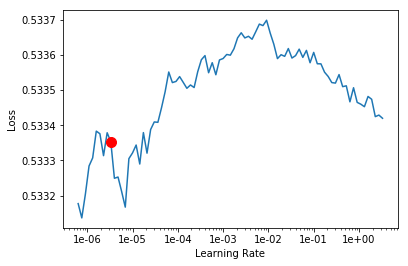

In [10]:
learn.lr_find()
learn.recorder.plot(suggestion=True)
print(learn.recorder.min_grad_lr)

In [12]:
lr = 1e-3
learn.fit_one_cycle(12, lr)

sample:  8540


epoch,train_loss,valid_loss,dice,time
0,0.533350,0.540964,0.008319,02:50
1,0.533412,0.540964,0.008319,02:51
2,0.533601,0.540964,0.008319,02:51
3,0.533465,0.540964,0.008319,02:51
4,0.533660,0.540964,0.008319,02:51
5,0.533429,0.540964,0.008319,02:51
6,0.533562,0.540964,0.008319,02:51
7,0.533579,0.540964,0.008319,02:51
8,0.533562,0.540964,0.008319,02:51
9,0.533624,0.540964,0.008319,02:54


# Unet with VGG16

In [23]:
a1 = data.train_dl.dataset[0]
et = invert_transform()

In [ ]:
a1[0].apply_tfms(et)

In [6]:
transforms = get_transforms()

#transforms[0].extend(
#    [
#        invert_transform(p=0.2),
#        elastic_transform(p=0.2),
#        clahe_transform(p=0.2)
#    ]
#)

In [7]:
data = (SegmentationItemList.from_folder(path=path/'train')
        .split_by_rand_pct(0.2)
        .label_from_func(lambda x : str(x).replace('train', 'masks'), classes=[0, 1])
        .add_test((path/'test').ls(), label=None)
        .transform(transforms, size=SZ, tfm_y=True)
        .databunch(path=Path('.'), bs=BS)
        .normalize(imagenet_stats))

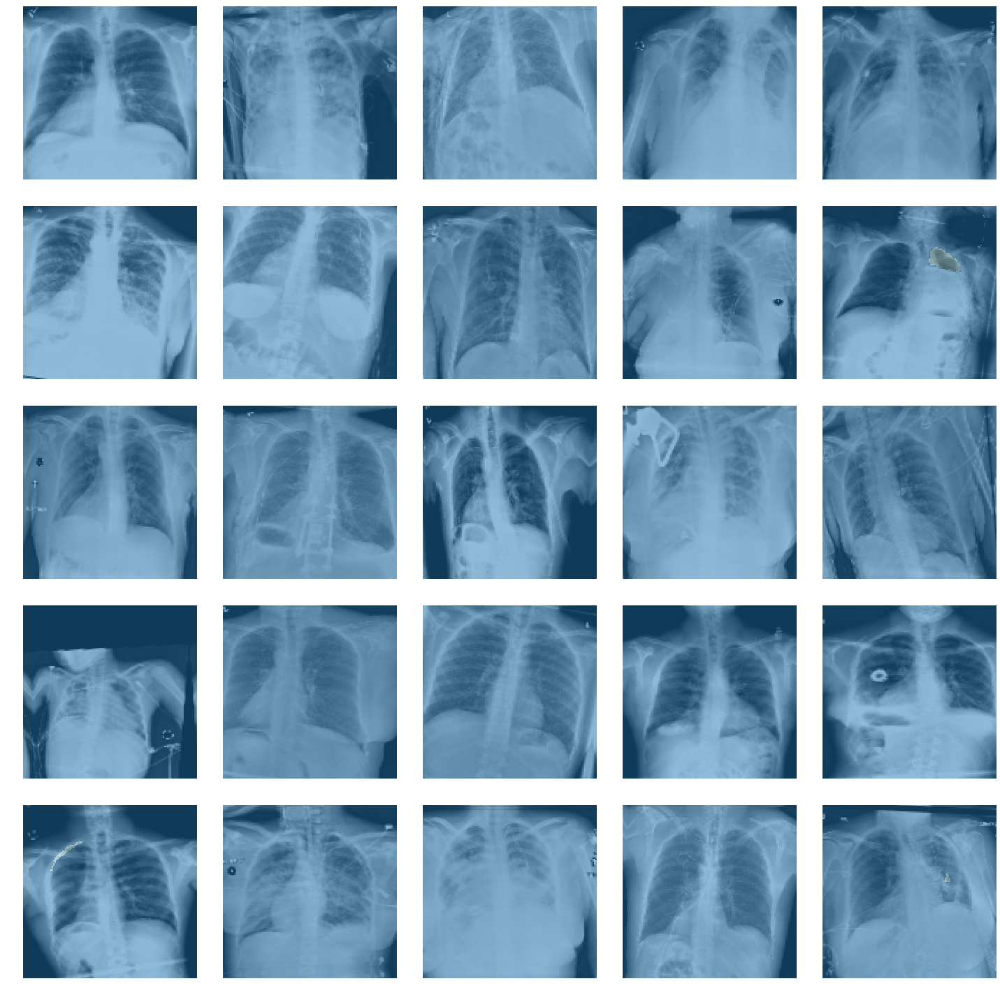

In [8]:
data.show_batch()

In [8]:
model = to_device(UNet16(pretrained=True, num_classes=2), data.device)
#learn = Learner(data, model, metrics=[dice], callback_fns=[OverSamplingCallbackHandler])
learn = Learner(data, model, metrics=[dice])
#learn.load("unet17_vgg_128px_oversample_extra_aug")
#learn.loss_func = crossentropy_softdice_loss()

In [6]:
#learn.load('unet_vgg_128px')

sample:  8540


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 3.63E-04
6.309573444801933e-07


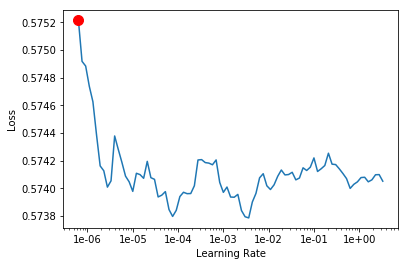

In [10]:
learn.lr_find()
learn.recorder.plot(suggestion=True)
print(learn.recorder.min_grad_lr)

In [ ]:
#lr = 2e-5
lr = 2e-3
learn.fit_one_cycle(12, lr)

epoch,train_loss,valid_loss,dice,time


In [ ]:
#lr = 1e-3
#learn.fit_one_cycle(12, lr)

In [ ]:
#lr = 1e-6
#learn.fit_one_cycle(12, lr)

In [12]:
learn.save(f'unet17_vgg_{SZ}px_oversample_extra_aug')

# UNET

In [6]:
def get_data():
    transforms = get_transforms()
    transforms[0].extend(
        [
            invert_transform(p=0.2),
            elastic_transform(p=0.2),
            clahe_transform(p=0.2),            
        ]
    )

    # Create databunch
    data = (SegmentationItemList.from_folder(path=path/'train')
            .split_by_rand_pct(0.2)
            .label_from_func(lambda x : str(x).replace('train', 'masks'), classes=[0, 1])
            .add_test((path/'test').ls(), label=None)
            .transform(transforms, size=SZ, tfm_y=True)
            .databunch(path=Path('.'), bs=BS)
            .normalize(imagenet_stats))
    return data

data = get_data()

In [ ]:
data.show_batch()

In [7]:
learn = unet_learner(data, models.resnet34, metrics=[dice], callback_fns=[OverSamplingCallbackHandler])

In [8]:
learn.load('unet_128_resnet34_3trans_oversample')

Learner(data=ImageDataBunch;

Train: LabelList (8540 items)
x: SegmentationItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegmentationLabelList
ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256)
Path: datasets/medical/siim-acr-pneumothorax-segmentation/resized/256/train;

Valid: LabelList (2135 items)
x: SegmentationItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegmentationLabelList
ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256)
Path: datasets/medical/siim-acr-pneumothorax-segmentation/resized/256/train;

Test: LabelList (1377 items)
x: SegmentationItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: data

In [9]:
#learn.loss_func = crossentropy_softdice_loss()
#learn.loss_func = flattened_loss()

learn.fit_one_cycle(6)

In [12]:
#learn.model

In [11]:
#learn.summary()

In [ ]:
learn.lr_find()
learn.recorder.plot(suggestion=True)
print(learn.recorder.min_grad_lr)

In [11]:
lr = 1e-3
learn.fit_one_cycle(6, lr)

epoch,train_loss,valid_loss,dice,time
0,0.007784,0.021067,0.000000,02:56
1,0.006141,0.019250,0.000000,02:48
2,0.006242,0.016457,0.000000,02:46
3,0.006412,0.014578,0.000000,02:45
4,0.005123,0.012635,0.053468,02:45
5,0.004979,0.012045,0.101565,02:45


In [12]:
learn.unfreeze()
lr = 1e-3
learn.fit_one_cycle(12, slice(lr/10, lr))

epoch,train_loss,valid_loss,dice,time
0,0.005144,0.013627,0.117599,02:54
1,0.005616,0.013093,0.011453,02:53
2,0.005966,0.017862,0.004052,02:53
3,0.005590,0.013057,0.000164,02:53
4,0.006309,0.016361,0.000000,02:52
5,0.005636,0.013491,0.000172,02:52
6,0.005885,0.012783,0.052837,02:53
7,0.005329,0.013056,0.042127,02:53
8,0.004869,0.012532,0.052543,02:53
9,0.004981,0.011999,0.075352,02:53


In [13]:
# Predictions for the validation set
preds, ys = learn.get_preds()
preds = preds[:,1,...]
ys = ys.squeeze()

In [36]:
#ds_type=DatasetType.Valid
#learn.data.dl(ds_type).dl.dataset.tfms.append(clahe_transform())
#preds, ys = learn.get_preds(ds_type)
#del learn.data.dl(ds_type).dl.dataset.tfms[-1]
#preds = preds[:,1,...]
#ys = ys.squeeze()
#preds = 0.5*(preds + torch.flip(preds_lr,[-1]))

In [37]:
# Find optimal threshold
dices = []
thrs = np.arange(0.01, 1, 0.01)
for i in progress_bar(thrs):
    preds_m = (preds>i).long()
    dices.append(dice_overall(preds_m, ys).mean())
dices = np.array(dices)

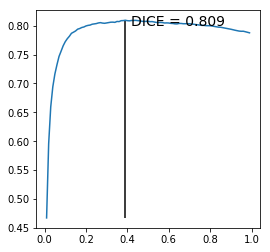

In [39]:
best_dice = dices.max()
best_thr = thrs[dices.argmax()]

plt.figure(figsize=(4,4))
plt.plot(thrs, dices)
plt.vlines(x=best_thr, ymin=dices.min(), ymax=dices.max())
plt.text(best_thr+0.03, best_dice-0.01, f'DICE = {best_dice:.3f}', fontsize=14);
plt.show()

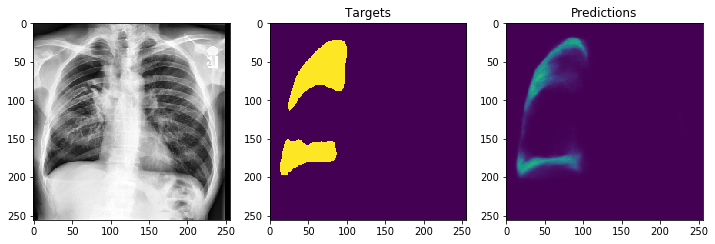

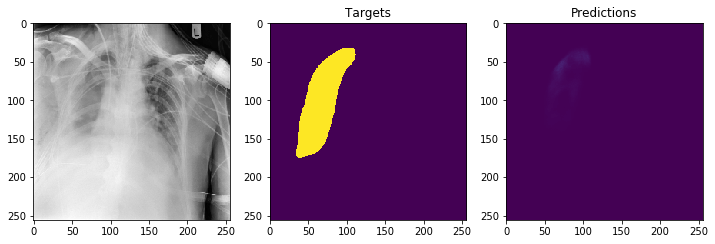

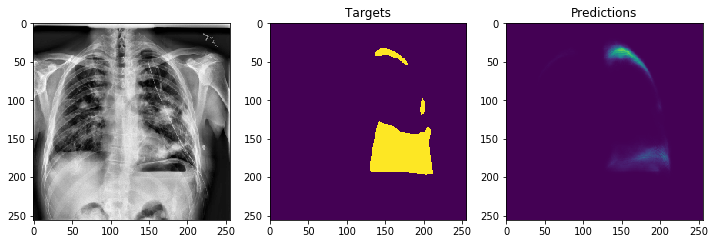

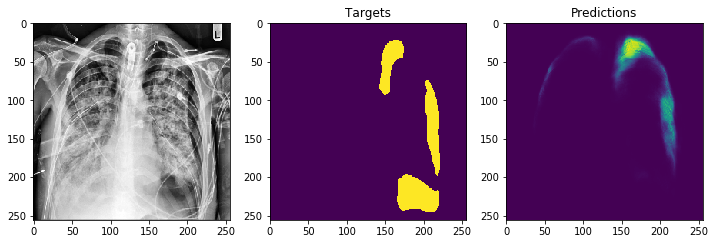

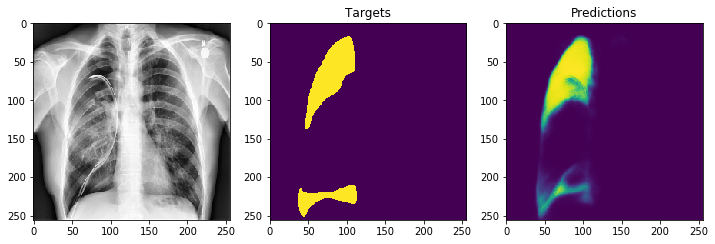

...

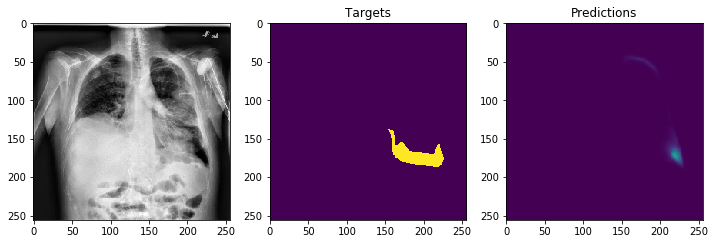

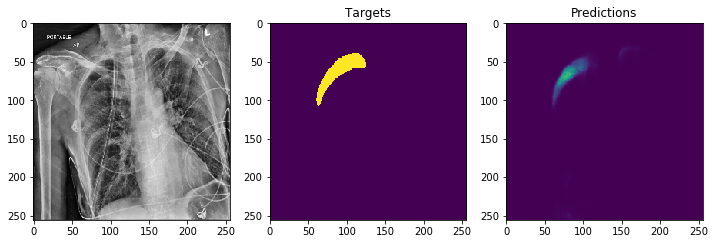

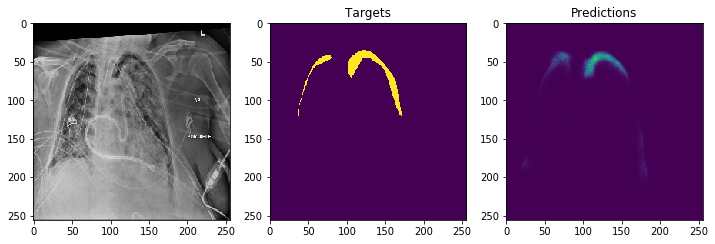

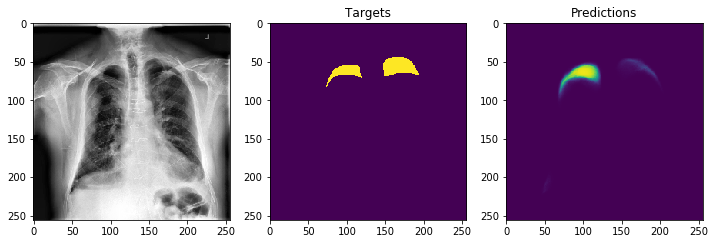

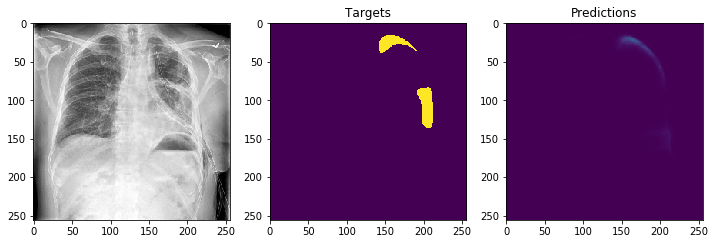

In [40]:
# Plot some samples
rows = 100
plot_idx = ys.sum((1,2)).sort(descending=True).indices[:rows]
for idx in plot_idx:
    fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(12, 4))
    ax0.imshow(data.valid_ds[idx][0].data.numpy().transpose(1,2,0))
    ax1.imshow(ys[idx], vmin=0, vmax=1)
    ax2.imshow(preds[idx], vmin=0, vmax=1)
    ax1.set_title('Targets')
    ax2.set_title('Predictions')
    plt.show()    

In [17]:
# Predictions for test set
preds, _ = learn.get_preds(ds_type=DatasetType.Test)
preds = (preds[:,1,...]>best_thr).long().numpy()
print(preds.sum())

3738


In [18]:
# Generate rle encodings (images are first converted to the original size)
rles = []
for p in progress_bar(preds):
    im = PIL.Image.fromarray((p.T*255).astype(np.uint8)).resize((1024,1024))
    im = np.asarray(im)
    rles.append(mask2rle(im, 1024, 1024))

In [19]:
ids = [o.stem for o in data.test_ds.items]
sub_df = pd.DataFrame({'ImageId': ids, 'EncodedPixels': rles})
sub_df.loc[sub_df.EncodedPixels=='', 'EncodedPixels'] = '-1'
sub_df.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.6607.151787519...,-1
1,1.2.276.0.7230010.3.1.4.8323329.6693.151787519...,-1
2,1.2.276.0.7230010.3.1.4.8323329.6228.151787519...,-1
3,1.2.276.0.7230010.3.1.4.8323329.6838.151787520...,-1
4,1.2.276.0.7230010.3.1.4.8323329.6735.151787519...,-1


In [20]:
sub_df.to_csv('submission_128_1.csv', index=False)

In [21]:
FileLink('submission_128_1.csv')

/media/disk6tb/myfiles/fastai_v1/notebooks/submission_128_1.csv

In [22]:
learn.save('unet_128_resnet34_3trans_oversample')

# Hypercolumns

In [6]:
from fastai.vision.learner import create_head, cnn_config, num_features_model, create_head
from fastai.callbacks.hooks import model_sizes, hook_outputs, dummy_eval, Hook, _hook_inner
from fastai.vision.models.unet import _get_sfs_idxs, UnetBlock

class Hcolumns(nn.Module):
    def __init__(self, hooks:Collection[Hook], nc:Collection[int]=None):
        super(Hcolumns,self).__init__()
        self.hooks = hooks
        self.n = len(self.hooks)
        self.factorization = None 
        if nc is not None:
            self.factorization = nn.ModuleList()
            for i in range(self.n):
                self.factorization.append(nn.Sequential(
                    conv2d(nc[i],nc[-1],3,padding=1,bias=True),
                    conv2d(nc[-1],nc[-1],3,padding=1,bias=True)))
                #self.factorization.append(conv2d(nc[i],nc[-1],3,padding=1,bias=True))
        
    def forward(self, x:Tensor):
        n = len(self.hooks)
        out = [F.interpolate(self.hooks[i].stored if self.factorization is None
            else self.factorization[i](self.hooks[i].stored), scale_factor=2**(self.n-i),
            mode='bilinear',align_corners=False) for i in range(self.n)] + [x]
        return torch.cat(out, dim=1)

class DynamicUnet_Hcolumns(SequentialEx):
    "Create a U-Net from a given architecture."
    def __init__(self, encoder:nn.Module, n_classes:int, blur:bool=False, blur_final=True, 
                 self_attention:bool=False,
                 y_range:Optional[Tuple[float,float]]=None,
                 last_cross:bool=True, bottle:bool=False, **kwargs):
        imsize = (256,256)
        sfs_szs = model_sizes(encoder, size=imsize)
        sfs_idxs = list(reversed(_get_sfs_idxs(sfs_szs)))
        self.sfs = hook_outputs([encoder[i] for i in sfs_idxs])
        x = dummy_eval(encoder, imsize).detach()

        ni = sfs_szs[-1][1]
        middle_conv = nn.Sequential(conv_layer(ni, ni*2, **kwargs),
                                    conv_layer(ni*2, ni, **kwargs)).eval()
        x = middle_conv(x)
        layers = [encoder, batchnorm_2d(ni), nn.ReLU(), middle_conv]

        self.hc_hooks = [Hook(layers[-1], _hook_inner, detach=False)]
        hc_c = [x.shape[1]]
        
        for i,idx in enumerate(sfs_idxs):
            not_final = i!=len(sfs_idxs)-1
            up_in_c, x_in_c = int(x.shape[1]), int(sfs_szs[idx][1])
            do_blur = blur and (not_final or blur_final)
            sa = self_attention and (i==len(sfs_idxs)-3)
            unet_block = UnetBlock(up_in_c, x_in_c, self.sfs[i], final_div=not_final, 
                blur=blur, self_attention=sa, **kwargs).eval()
            layers.append(unet_block)
            x = unet_block(x)
            self.hc_hooks.append(Hook(layers[-1], _hook_inner, detach=False))
            hc_c.append(x.shape[1])

        ni = x.shape[1]
        if imsize != sfs_szs[0][-2:]: layers.append(PixelShuffle_ICNR(ni, **kwargs))
        if last_cross:
            layers.append(MergeLayer(dense=True))
            ni += in_channels(encoder)
            layers.append(res_block(ni, bottle=bottle, **kwargs))
        hc_c.append(ni)
        layers.append(Hcolumns(self.hc_hooks, hc_c))
        layers += [conv_layer(ni*len(hc_c), n_classes, ks=1, use_activ=False, **kwargs)]
        if y_range is not None: layers.append(SigmoidRange(*y_range))
        super().__init__(*layers)

    def __del__(self):
        if hasattr(self, "sfs"): self.sfs.remove()
            
def unet_learner(data:DataBunch, arch:Callable, pretrained:bool=True, blur_final:bool=True,
        norm_type:Optional[NormType]=NormType, split_on:Optional[SplitFuncOrIdxList]=None, 
        blur:bool=False, self_attention:bool=False, y_range:Optional[Tuple[float,float]]=None, 
        last_cross:bool=True, bottle:bool=False, cut:Union[int,Callable]=None, 
        hypercolumns=True, **learn_kwargs:Any)->Learner:
    "Build Unet learner from `data` and `arch`."
    meta = cnn_config(arch)
    body = create_body(arch, pretrained, cut)
    M = DynamicUnet_Hcolumns if hypercolumns else DynamicUnet
    model = to_device(M(body, n_classes=data.c, blur=blur, blur_final=blur_final,
        self_attention=self_attention, y_range=y_range, norm_type=norm_type, 
        last_cross=last_cross, bottle=bottle), data.device)
    learn = Learner(data, model, **learn_kwargs)
    learn.split(ifnone(split_on, meta['split']))
    if pretrained: learn.freeze()
    apply_init(model[2], nn.init.kaiming_normal_)
    return learn

In [9]:
def dice(input:Tensor, targs:Tensor, iou:bool=False, eps:float=1e-8)->Rank0Tensor:
    n = targs.shape[0]
    input = torch.softmax(input, dim=1)[:,1,...].view(n,-1)
    input = (input > BEST_THR0).long()
    input[input.sum(-1) < NOISE_TH,...] = 0.0 
    #input = input.argmax(dim=1).view(n,-1)
    targs = targs.view(n,-1)
    intersect = (input * targs).sum(-1).float()
    union = (input+targs).sum(-1).float()
    if not iou: return ((2.0*intersect + eps) / (union+eps)).mean()
    else: return ((intersect + eps) / (union - intersect + eps)).mean()

In [10]:
# Prediction with flip TTA
def pred_with_flip(learn:fastai.basic_train.Learner,
                   ds_type:fastai.basic_data.DatasetType=DatasetType.Valid):
    #get prediction
    preds, ys = learn.get_preds(ds_type)
    preds = preds[:,1,...]
    #add fiip to dataset and get prediction
    learn.data.dl(ds_type).dl.dataset.tfms.append(flip_lr())
    preds_lr, ys = learn.get_preds(ds_type)
    del learn.data.dl(ds_type).dl.dataset.tfms[-1]
    preds_lr = preds_lr[:,1,...]
    ys = ys.squeeze()
    preds = 0.5*(preds + torch.flip(preds_lr,[-1]))
    del preds_lr
    gc.collect()
    torch.cuda.empty_cache()
    return preds, ys

In [11]:
def get_data(fold):
    kf = KFold(n_splits=NFOLDS, shuffle=True, random_state=SEED)
    valid_idx = list(kf.split(list(range(len(Path(path/'train').ls())))))[fold][1]
    # Create databunch
    data = (SegmentationItemList.from_folder(path/'train')
            .split_by_idx(valid_idx)
            .label_from_func(lambda x : str(x).replace('train', 'masks'), classes=[0,1])
            .add_test(Path(path/'test').ls(), label=None)
            .transform(get_transforms(), size=SZ, tfm_y=True)
            .databunch(path=Path('.'), bs=BS)
            .normalize(STATS))
    return data

# Display some images with masks
#get_data(0).show_batch()

In [12]:
"""
data = get_data(0)
learn = unet_learner(data, models.resnet50, metrics=[dice])
learn.lr_find()
learn.recorder.plot()
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()
"""

'\ndata = get_data(0)\nlearn = unet_learner(data, models.resnet50, metrics=[dice])\nlearn.lr_find()\nlearn.recorder.plot()\nlearn.unfreeze()\nlearn.lr_find()\nlearn.recorder.plot()\n'

In [13]:
scores, best_thrs = [],[]

for fold in range(NFOLDS):
    model_suffix = f"{fold}_{SZ}px"
    print('fold: ', fold)
    data = get_data(fold)
    learn = unet_learner(data, models.resnet50, metrics=[dice])
    learn.clip_grad(1.0);
    set_BN_momentum(learn.model)
    
    #fit the decoder part of the model keeping the encode frozen
    lr = 1e-3
    #learn.fit_one_cycle(1, lr, callbacks = [AccumulateStep(learn,NACC)])
    learn.fit_one_cycle(6, lr, callbacks = [AccumulateStep(learn, NACC)])
    
    #fit entire model with saving on the best epoch
    learn.unfreeze()
    #learn.fit_one_cycle(1, slice(lr/80, lr/2), callbacks=[AccumulateStep(learn,NACC)])
    learn.fit_one_cycle(12, slice(lr/80, lr/2), callbacks=[AccumulateStep(learn,NACC)])    
    learn.save(f'hypercolumns_fold_{model_suffix}.model')
    
    #prediction on val and test sets
    preds, ys = pred_with_flip(learn)
    pt, _ = pred_with_flip(learn,DatasetType.Test)
    
    if fold == 0: preds_test = pt
    else: preds_test += pt
        
    #convert predictions to byte type and save
    preds_save = (preds*255.0).byte()
    torch.save(preds_save, f'preds_fold{model_suffix}.pt')
    np.save(f'hypercolumns_items_fold{model_suffix}', data.valid_ds.items)
        
    #remove noise
    preds[preds.view(preds.shape[0],-1).sum(-1) < NOISE_TH,...] = 0.0

    #optimal threshold 
    #The best way would be collecting all oof predictions followed by a single threshold
    #calculation. However, it requres too much RAM for high image resolution
    dices = []
    thrs = np.arange(0.01, 1, 0.01)
    for th in progress_bar(thrs):
        preds_m = (preds>th).long()
        dices.append(dice_overall(preds_m, ys).mean())
    dices = np.array(dices)    
    scores.append(dices.max())
    best_thrs.append(thrs[dices.argmax()])
     
    if fold != NFOLDS-1: del preds, ys, preds_save
    gc.collect()
    torch.cuda.empty_cache()
    
preds_test /= NFOLDS

(256, 256)

In [14]:
print('scores: ', scores)
print('mean score: ', np.array(scores).mean())
print('thresholds: ', best_thrs)
best_thr = np.array(best_thrs).mean()
print('best threshold: ', best_thr)

scores:  [0.8021646, 0.79934794, 0.77900857, 0.79424024]
mean score:  0.7936903
thresholds:  [0.25, 0.59, 0.68, 0.28]
best threshold:  0.45


In [15]:
best_thr

0.45

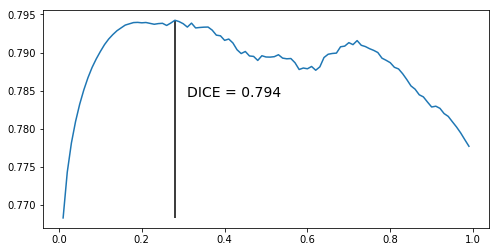

In [16]:
best_dice = dices.max()
plt.figure(figsize=(8,4))
plt.plot(thrs, dices)
plt.vlines(x=best_thrs[-1], ymin=dices.min(), ymax=dices.max())
plt.text(best_thrs[-1]+0.03, best_dice-0.01, f'DICE = {best_dice:.3f}', fontsize=14);
plt.show()

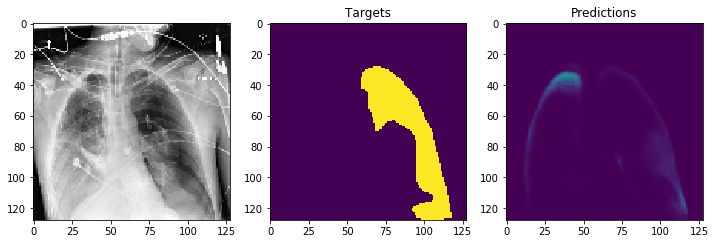

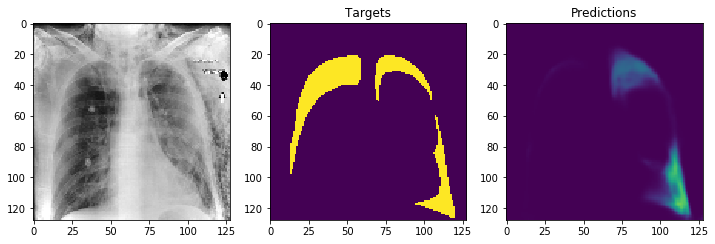

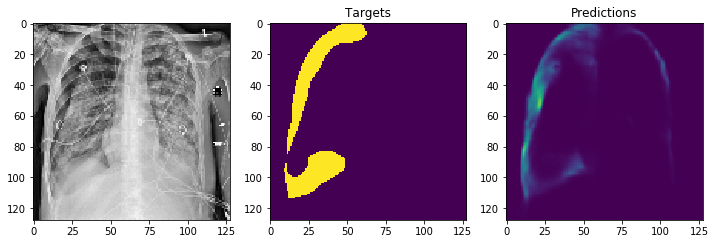

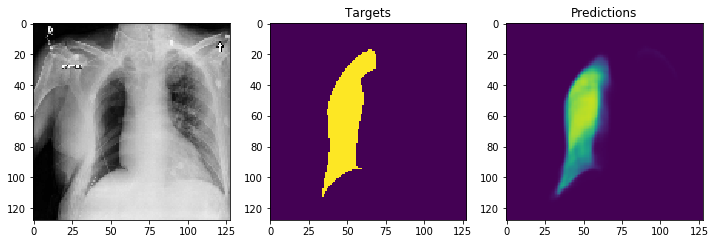

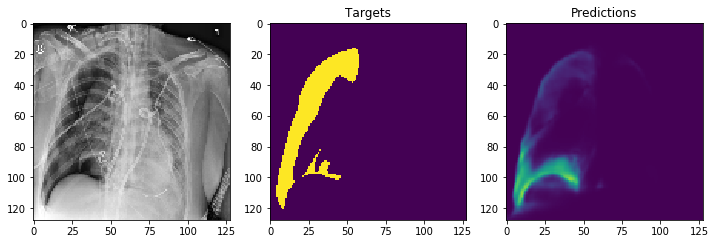

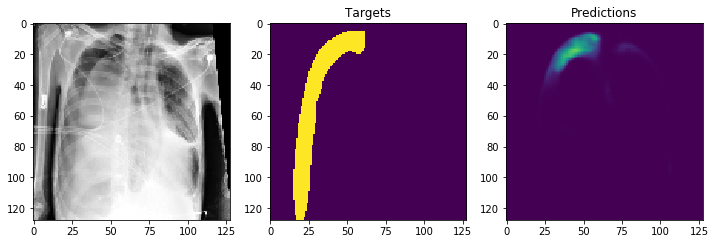

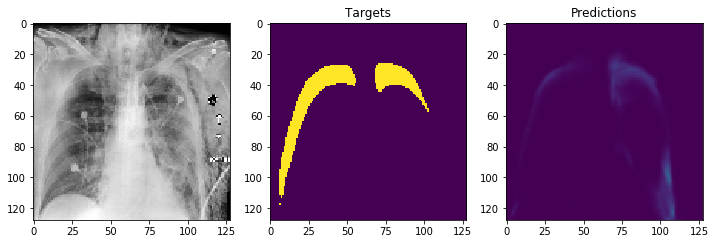

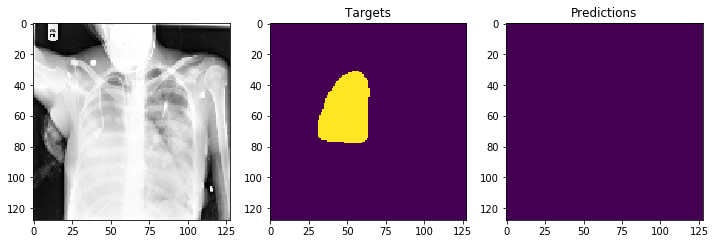

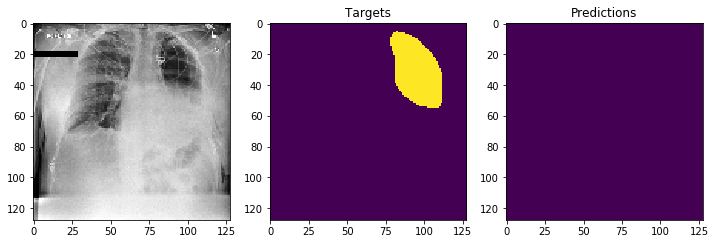

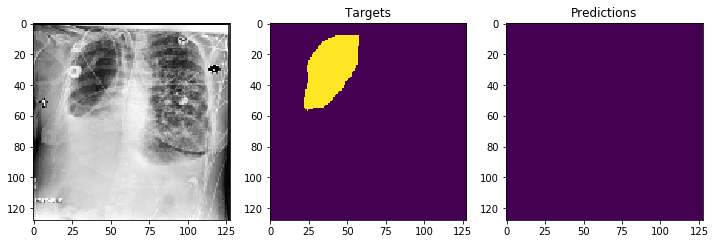

In [17]:
# Plot some samples
rows = 10
plot_idx = ys.sum((1,2)).sort(descending=True).indices[:rows]
for idx in plot_idx:
    fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(12, 4))
    ax0.imshow(data.valid_ds[idx][0].data.numpy().transpose(1,2,0))
    ax1.imshow(ys[idx], vmin=0, vmax=1)
    ax2.imshow(preds[idx], vmin=0, vmax=1)
    ax1.set_title('Targets')
    ax2.set_title('Predictions')

In [18]:
#convert predictions to byte type and save
preds_save = (preds_test*255.0).byte()
torch.save(preds_save, 'preds_test.pt')

preds_test[preds_test.view(preds_test.shape[0],-1).sum(-1) < NOISE_TH,...] = 0.0

In [19]:
#best_thr = 0.2
# Generate rle encodings (images are first converted to the original size)
preds_test = (preds_test>best_thr).long().numpy()
rles = []
for p in progress_bar(preds_test):
    im = PIL.Image.fromarray((p.T*255).astype(np.uint8)).resize((1024,1024))
    im = np.asarray(im)
    rles.append(mask2rle(im, 1024, 1024))

In [23]:
ids = [o.stem for o in data.test_ds.items]
sub_df = pd.DataFrame({'ImageId': ids, 'EncodedPixels': rles})
sub_df.loc[sub_df.EncodedPixels=='', 'EncodedPixels'] = '-1'
sub_df.to_csv('submission_hypercolumns_128_resnet50_1.csv', index=False)
sub_df.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.6607.151787519...,-1
1,1.2.276.0.7230010.3.1.4.8323329.6693.151787519...,-1
2,1.2.276.0.7230010.3.1.4.8323329.6228.151787519...,770248 8 1016 8 1016 8 1016 8 1016 8 1016 8 10...
3,1.2.276.0.7230010.3.1.4.8323329.6838.151787520...,-1
4,1.2.276.0.7230010.3.1.4.8323329.6735.151787519...,-1


In [22]:
#learn.save('hypercolumns_128px_resnet50_1')

In [24]:
FileLink('submission_hypercolumns_128_resnet50_1.csv')

/media/disk6tb/myfiles/fastai_v1/notebooks/submission_hypercolumns_128_resnet50_1.csv

In [27]:
learn.loss_func

FlattenedLoss of CrossEntropyLoss()

# References
1. DataPreparation: https://www.kaggle.com/iafoss/data-repack-and-image-statistics
1. https://www.kaggle.com/mnpinto/pneumothorax-fastai-u-net/

